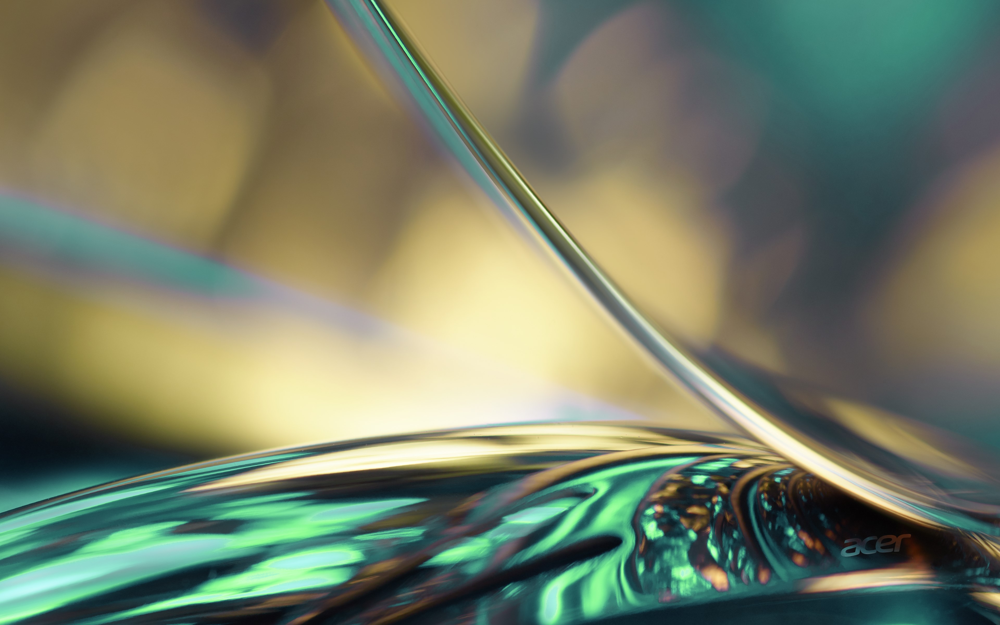

In [2]:
# First, lets import all of the library functions we need
import PIL
from PIL import Image
from IPython.display import display

# And lets load the image we were working, and we can just convert it to RGB 
file="C:/Users/user/OneDrive/Pictures/Screenshots/Acer_Wallpaper.jpg"
image=Image.open(file)
image=image.convert("RGB")
display(image)


In [3]:
# A task that is fairly common in image and picture manipulation is to create contact sheets of images.
# A contact sheet is one image that actually contains several other different images. Lets try and make contact sheet
# the brightness of the image in ten different ways, then scale the image down smaller, and put them side
# by side so we can get the sense of which brightness we might want to use.
#
# First up, lets import the ImageEnhance module, which has a nice object called Brightness
from PIL import ImageEnhance

In [ ]:
help(PIL.ImageEnhance)

In [ ]:
help(PIL.ImageEnhance.Brightness)

In [5]:
# Checking the online documentation for this function, it takes a value between 0.0 (a completely black
# image) and 1.0 (the original image) to adjust the brightness. All of the classes in the ImageEnhance module
# do this the same way, you create an object, in this case Brightness, then you call the enhance function()
# on that object with an appropriate parameter.
#
# Lets write a little loop to generate ten images of different brightness. First we need the Brightness
# object with our image
enhancer=ImageEnhance.Brightness(image.crop((400, 100, 3000, 800)))
images=[]
for i in range(0,10):
    # We'll divide i by ten to get the decimal value we want, and append it to the images list
    # we actually call the brightness routine by calling the enhance() function. Remember, you can dig into
    # details of this using the help() function, or by consulting web docs
    images.append(enhancer.enhance(i/10))
# We can see the result here is a list of ten PIL.Image.Image objects. Jupyter nicely prints out the value
# of python objects nested in lists
print(images)    
    

[<PIL.Image.Image image mode=RGB size=2600x700 at 0x25379D49510>, <PIL.Image.Image image mode=RGB size=2600x700 at 0x2537A48F2D0>, <PIL.Image.Image image mode=RGB size=2600x700 at 0x2537A4A6710>, <PIL.Image.Image image mode=RGB size=2600x700 at 0x2537A4A6790>, <PIL.Image.Image image mode=RGB size=2600x700 at 0x2537A4A6810>, <PIL.Image.Image image mode=RGB size=2600x700 at 0x2537A4A6950>, <PIL.Image.Image image mode=RGB size=2600x700 at 0x2537A4A69D0>, <PIL.Image.Image image mode=RGB size=2600x700 at 0x2537A4A6A50>, <PIL.Image.Image image mode=RGB size=2600x700 at 0x2537A4A6AD0>, <PIL.Image.Image image mode=RGB size=2600x700 at 0x2537A4A6890>]


In [ ]:
# Lets take these images now and composite them, one above another, in a contact sheet.
# There are several different approaches we can use, but I'll simply create a new image which is like
# the first image, but ten times as high. Lets check out the PIL.Image.new functionality
help(PIL.Image.new)


## we have a list of 10 crop imges.
# The new function requires that we pass it a mode. We're going to use the mode 'RGB' which stands for
# Red, Green, and Blue, and is the mode of our current first image. There are lots of different image mode
# formats, and this one is most common.
# For the size we have a tuple, which is the width of the image and the height. We'll use the width of our
# current first image, but for the height we'll multiple this by ten. This will make a sort of "canvas" for
# our contact sheet. Finally, the color is optional, and we'll just leave it at black.
first_image=images[0]
contact_sheet=PIL.Image.new(first_image.mode, (first_image.width, first_image.height *10))

# So now we have a black image that's ten times the size of the other images in the contact_sheet
# variable. Now lets just loop through the image list and paste() the results in. The paste() function
# will be called on the contact_sheet object, and takes in a new image to paste, as well as an (x,y)
# offset for that image. In our case, the x position is always 0, but the y location will change by
# 700 pixels each time we iterate through the loop.
#
# Lets first create a counter variable for the y location. It will start at zero
current_location=0
for img in images:
    # Lets paste the current image into the contact sheet
    contact_sheet.paste(img, (0, current_location) )
    current_location=current_location+ 700

# This contact sheet has gotten big: 7000 pixels tall! Lets just resize this sheet for display. We can do
# this using the resize() function. This function just takes a tuple of width and height, and we'll resize
# everything down to the size of just two individual images
contact_sheet = contact_sheet.resize((2600,900) )
# Now lets just display that composite image
display(contact_sheet)    
    


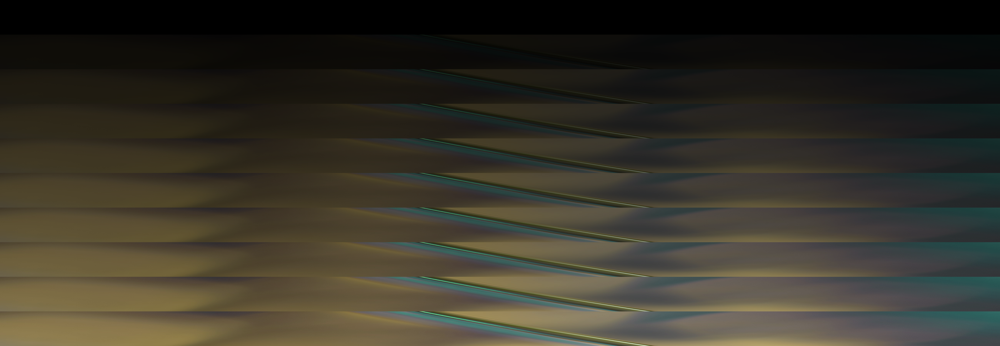

In [7]:
first_image=images[0]
contact_sheet=PIL.Image.new(first_image.mode, (first_image.width, first_image.height *10))
current_location=0 
for img in images: 
    # Lets paste the current image into the contact sheet 
    contact_sheet.paste(img, (0, current_location) )
    current_location=current_location+ 700
contact_sheet = contact_sheet.resize((2600,900)) 
display(contact_sheet)

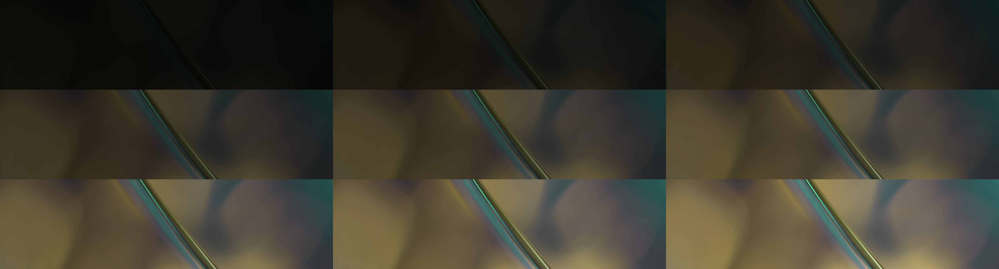

In [8]:
# Ok, that's a nice proof of concept. But it's a little tough to see. Lets instead change this to a three
# by three grid of values. First thing we should do is make our canvas, and we'll make it 3 times the
# width of our image and 3 times the height of our image - a nine image square
contact_sheet=PIL.Image.new(first_image.mode, (first_image.width*3,first_image.height*3))
# Now we want to iterate over our images and place them into this grid. Remember that in PIL we manage the
# location of where we refer to as an image in the upper right hand corner, so this will be 0,0. Lets use
# one variable for the X dimension, and one for the Y dimension.
x=0
y=0
# Now, lets iterate over our images. Except, we don't want to both with the first one, because it is
# just solid black. Instead we want to just deal with the images after the first one, and that should
# give us nine in total
for img in images[1:]:
    # Lets paste the current image into the contact sheet
    contact_sheet.paste(img, (x, y))
    # Now we update our X position. If it is going to be the width of the image, then we set it to 0
    # and update Y as well to point to the next "line" of the contact sheet.

    if x+first_image.width == contact_sheet.width:
        x=0
        y=y+first_image.height
    else:
        x=x+first_image.width

# Now lets resize the contact sheet. We'll just make it half the size by dividing it by two. And, because
# the resize function needs to take round numbers, we need to convert our divisions from floating point
# numbers into integers using the int() function.
contact_sheet = contact_sheet.resize((int(contact_sheet.width/2),int(contact_sheet.height/2) ))
# Now lets display that composite image
display(contact_sheet)

